In [1]:
group_num = 25
variant_count = 16
variant_num = (group_num - 1) % variant_count + 1
variant_num

9

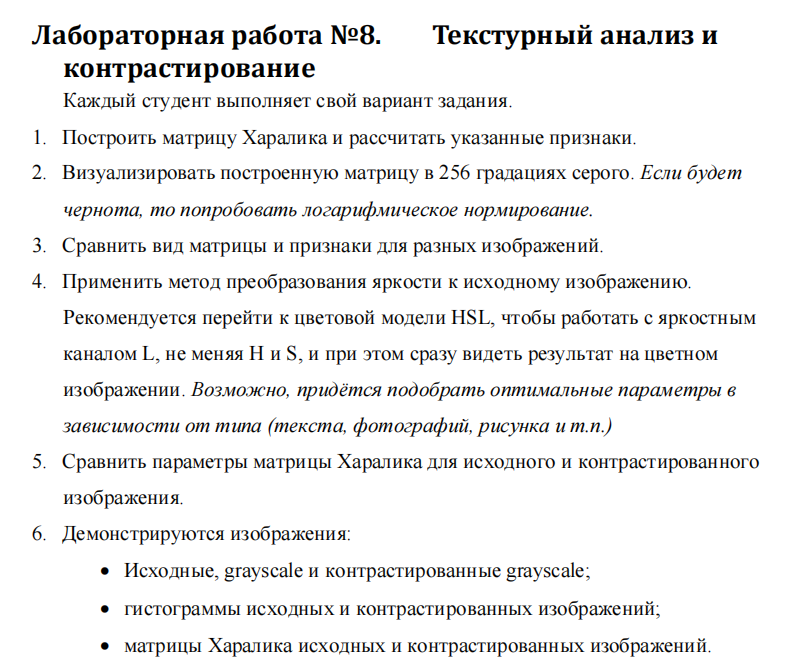

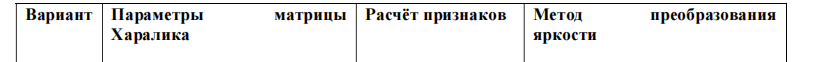

In [2]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

In [5]:
def photoshop_grayscale(image):
    result = Image.new('L', (image.width, image.height))

    for x in range(result.width):
        for y in range(result.height):
            pixel = image.getpixel((x, y))
            new_pixel = int(round(pixel[0] * 0.3 + pixel[1] * 0.59 + pixel[2] * 0.11))
            result.putpixel((x, y), new_pixel)

    return result

In [117]:
def get_haralic(img):
    size = 256

    haralic_matrix = np.zeros((size, size))
    width = img.size[0]
    height = img.size[1]
    img_arr = np.asarray(img).transpose()

    for x in range(1, width - 1):
        for y in range(1, height - 1):
            pixel = img_arr[x, y]

            up_left_pixel = img_arr[x-1, y-1]
            down_left_pixel = img_arr[x-1, y+1]
            up_right_pixel = img_arr[x+1, y-1]
            down_right_pixel = img_arr[x+1, y+1]

            haralic_matrix[pixel, up_left_pixel] += 1
            haralic_matrix[pixel, down_left_pixel] += 1
            haralic_matrix[pixel, up_right_pixel] += 1
            haralic_matrix[pixel, down_right_pixel] += 1

    haralic_img = Image.fromarray(haralic_matrix).convert('L')
    return haralic_img, haralic_matrix

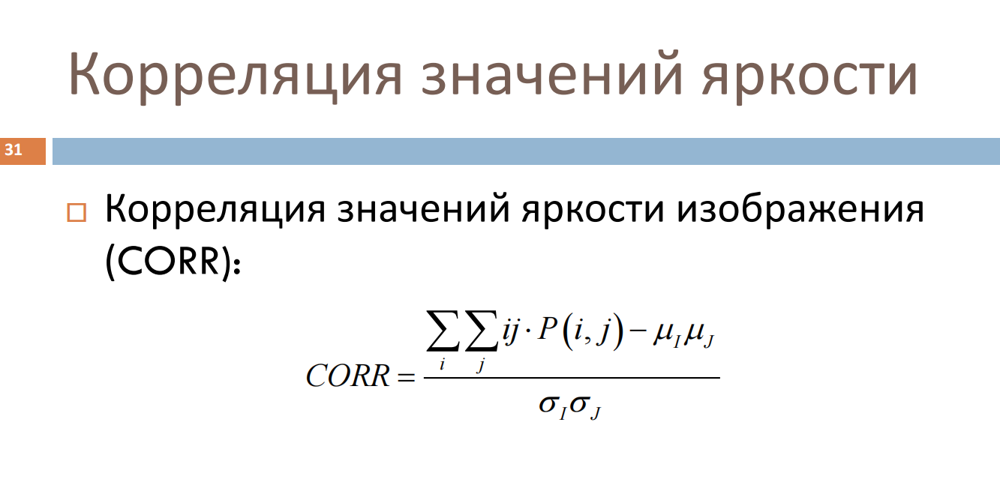

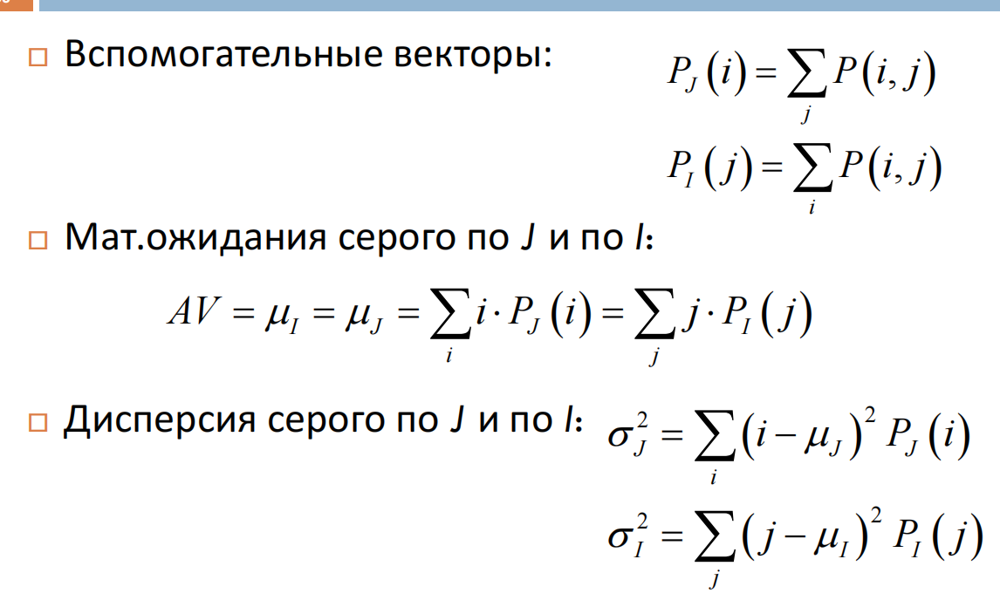

In [135]:
def get_Pj(i, matrix):
    Pj = 0
    for j in range(matrix.shape[1]):
        Pj += matrix[i, j]
    return Pj

In [136]:
def get_Pi(j, matrix):
    Pi = 0
    for i in range(matrix.shape[0]):
        Pi += matrix[i, j]
    return Pi

In [141]:
def get_corr(haralic_matrix):
    size = haralic_matrix.shape[0]
    
    mu_I = 0
    mu_J = 0
    for i in range(size):
        mu_I += (i+1) * get_Pj(i, haralic_matrix)

    for j in range(size):
        mu_J += (j+1) * get_Pi(j, haralic_matrix)

    sigma_J_2 = 0
    sigma_I_2 = 0

    for i in range(size):
        sigma_J_2 += (i+1-mu_J)**2 * get_Pj(i, haralic_matrix)


    for j in range(size):
        sigma_I_2 += (j+1-mu_I)**2 * get_Pi(j, haralic_matrix)

    sigma_I = np.sqrt(sigma_I_2)
    sigma_J = np.sqrt(sigma_J_2)


    el_1 = 0
    for i in range(size):
        for j in range(size):
            el_1 += (i+1) * (j+1) * haralic_matrix[i, j]


    sigma_multiplied = sigma_I * sigma_J
    corr = (el_1 - mu_I * mu_J) / sigma_multiplied
    
    return corr

In [219]:
def hist_plt(image):
    matrix = np.asarray(image)
    shape = np.reshape(matrix, (1, -1))
    plt.figure()
    plt.hist(shape[0], bins=256)
    return plt

In [208]:
def contrast(img, gamma = 0.5, c = 1, f_zero = 0):
    result_matrix = np.asarray(img) / 255
    result_matrix = c * pow(result_matrix + f_zero, gamma)
    result_matrix = (result_matrix * 255).astype(np.uint8)
    
    result = Image.fromarray(result_matrix)
    return result

In [228]:
def result_display(img_name):
    img = Image.open(img_name)
    grayscaled_img = photoshop_grayscale(img)
    contrast_img = contrast(grayscaled_img, 0.55)
    print("Исходное изображение")
    display(img)
    print("Grayscale изображение")
    display(grayscaled_img)
    print("Контрастированное изображение")
    display(contrast_img)
    print("Гистограмма исходного изображения")
    hist_plt(grayscaled_img).show()
    print("Гистограмма контрастированного изображения")
    hist_plt(contrast_img).show()
    haralic_img, haralic_matrix = get_haralic(grayscaled_img)
    contrast_haralic_img, contrast_haralic_matrix = get_haralic(contrast_img)
    print("Матрица Харалика исходного изображения")
    display(haralic_img)
    print("Матрица Харалика контрастированного изображения")
    display(contrast_haralic_img)
    corr = get_corr(haralic_matrix)
    contrast_corr = get_corr(contrast_haralic_matrix)
    print(f"Корреляция исходного изображения = {corr}")
    print(f"Корреляция контрастированного изображения = {contrast_corr}")
    pass

Исходное изображение


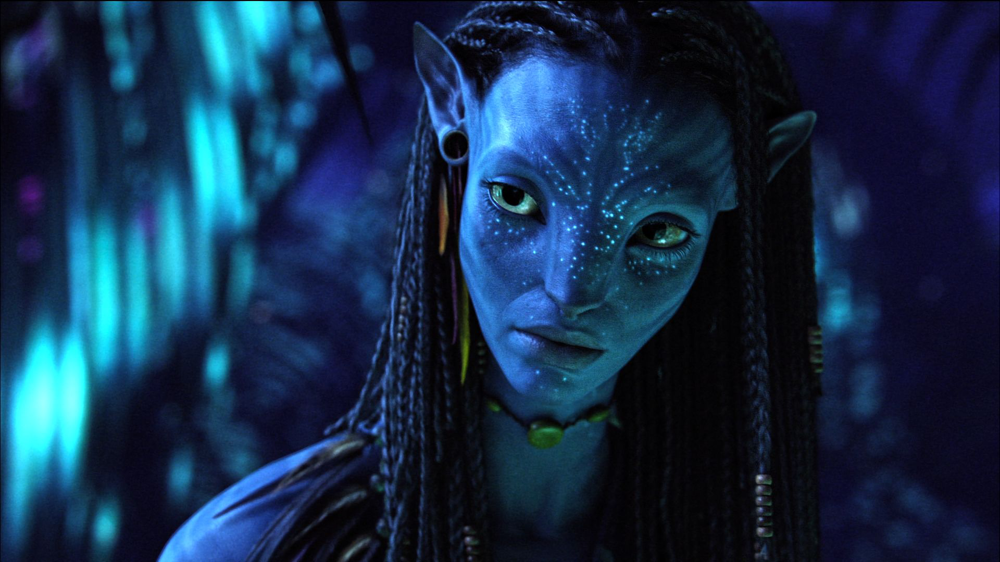

Grayscale изображение


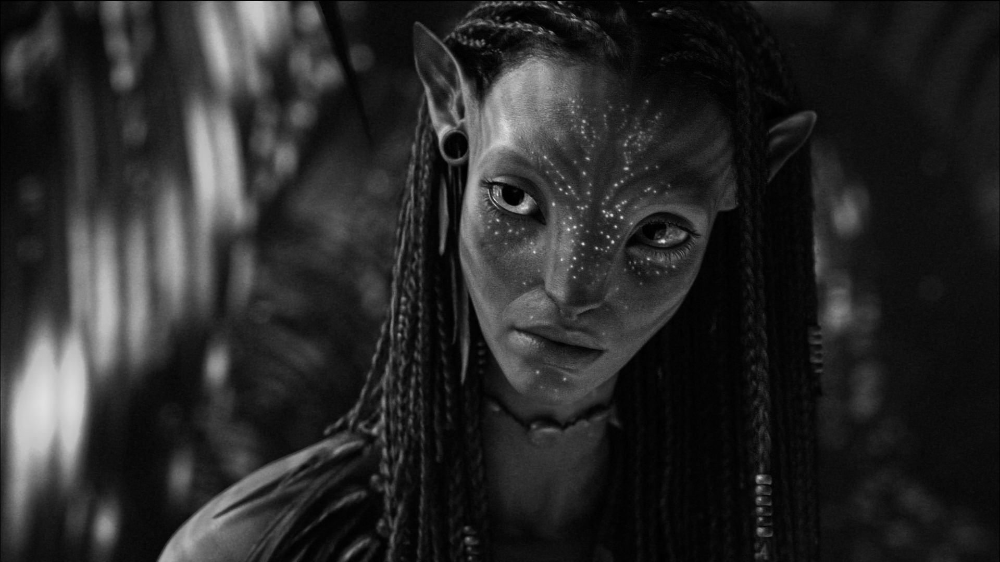

Контрастированное изображение


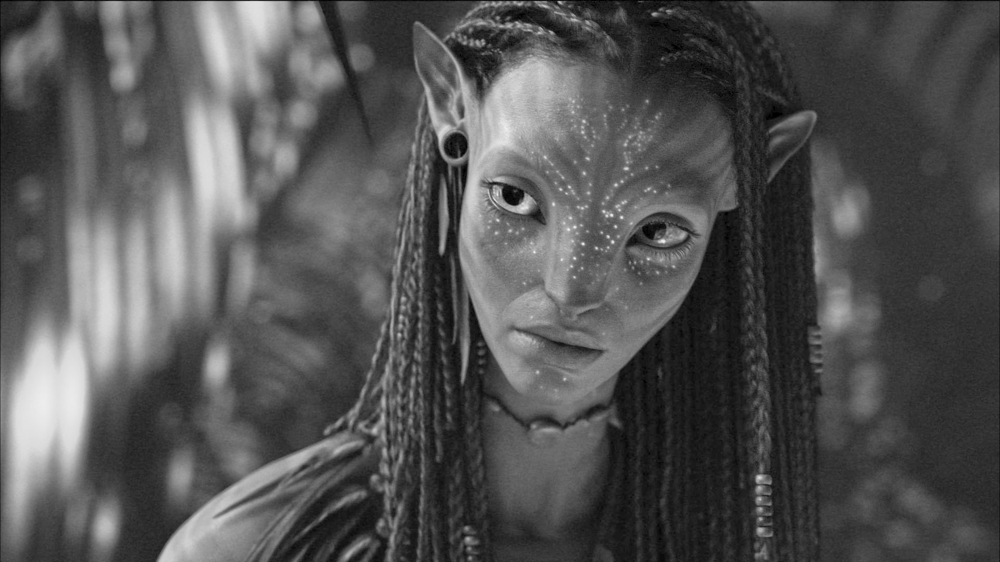

Гистограмма исходного изображения


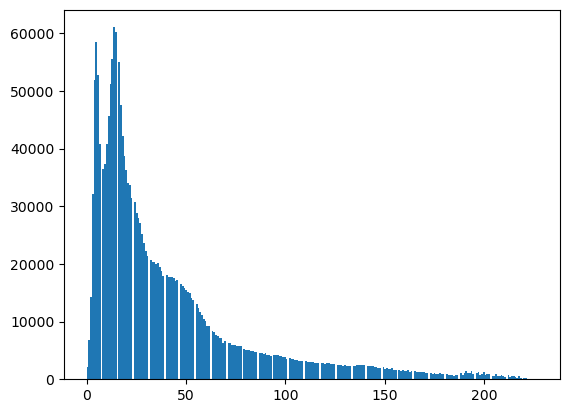

Гистограмма контрастированного изображения


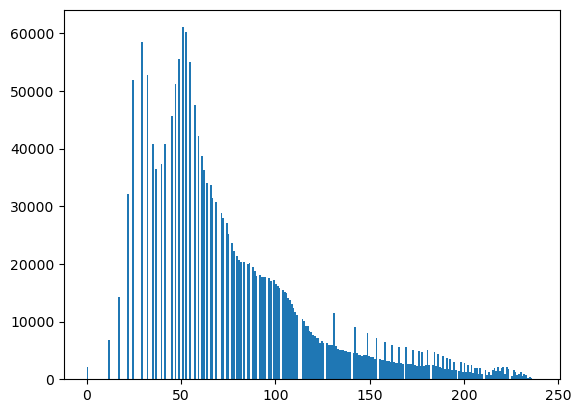

Матрица Харалика исходного изображения


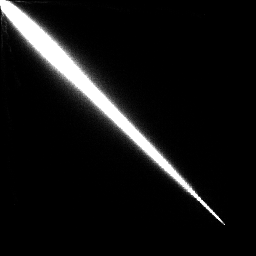

Матрица Харалика контрастированного изображения


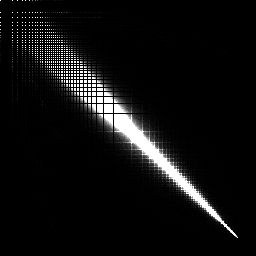

Корреляция исходного изображения = -1.2091290272790733e-07
Корреляция контрастированного изображения = -1.2091291240922562e-07


In [229]:
result_display("avatar.png")

Исходное изображение


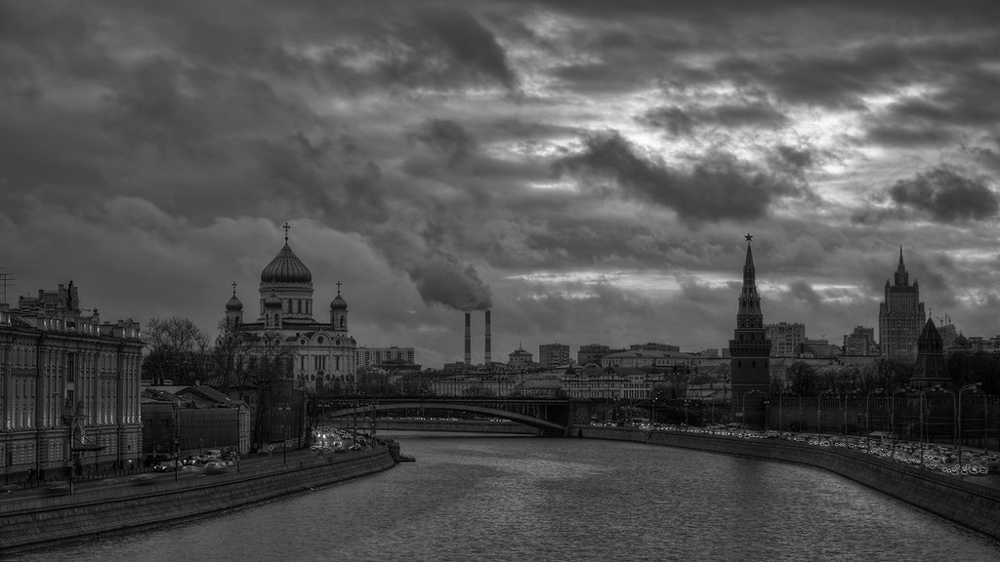

Grayscale изображение


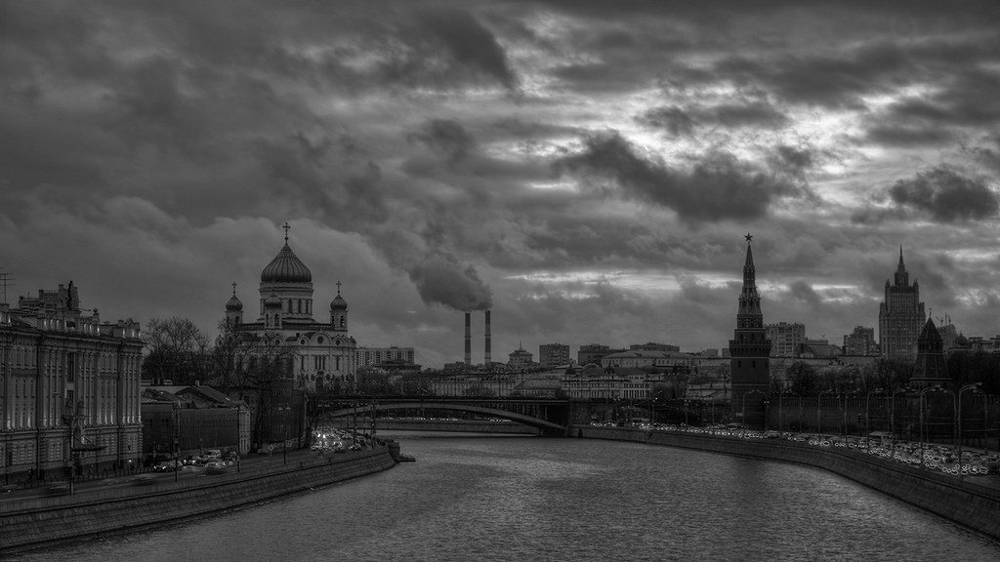

Контрастированное изображение


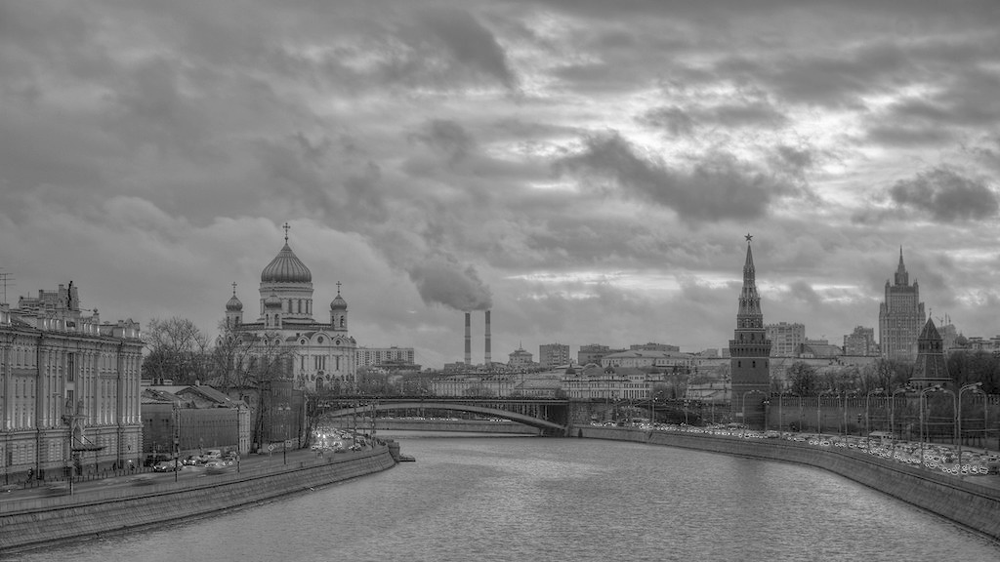

Гистограмма исходного изображения


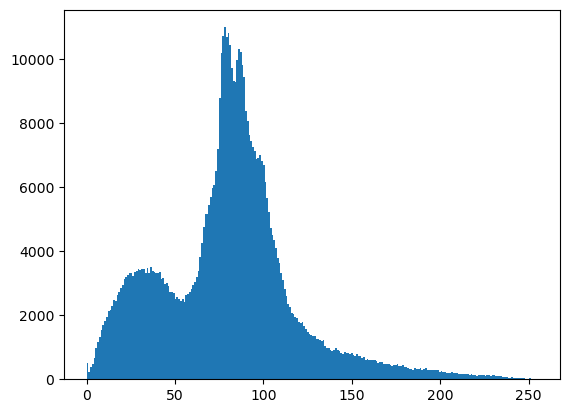

Гистограмма контрастированного изображения


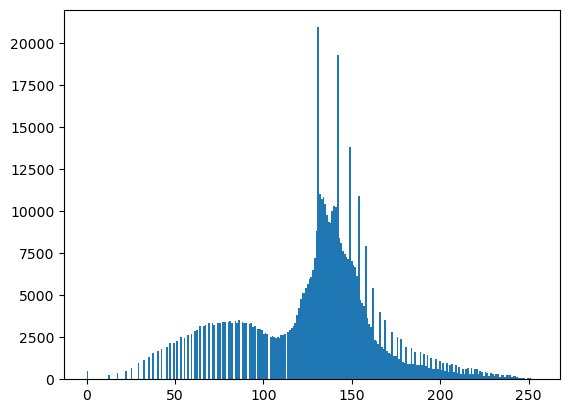

Матрица Харалика исходного изображения


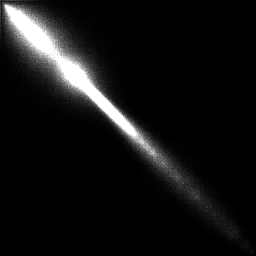

Матрица Харалика контрастированного изображения


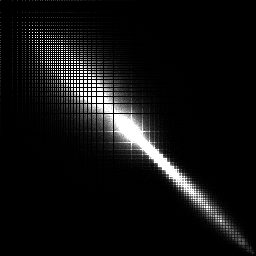

Корреляция исходного изображения = -4.2616459388863564e-07
Корреляция контрастированного изображения = -4.2616461930947384e-07


In [230]:
result_display("dark_moscow_picture.png")

Исходное изображение


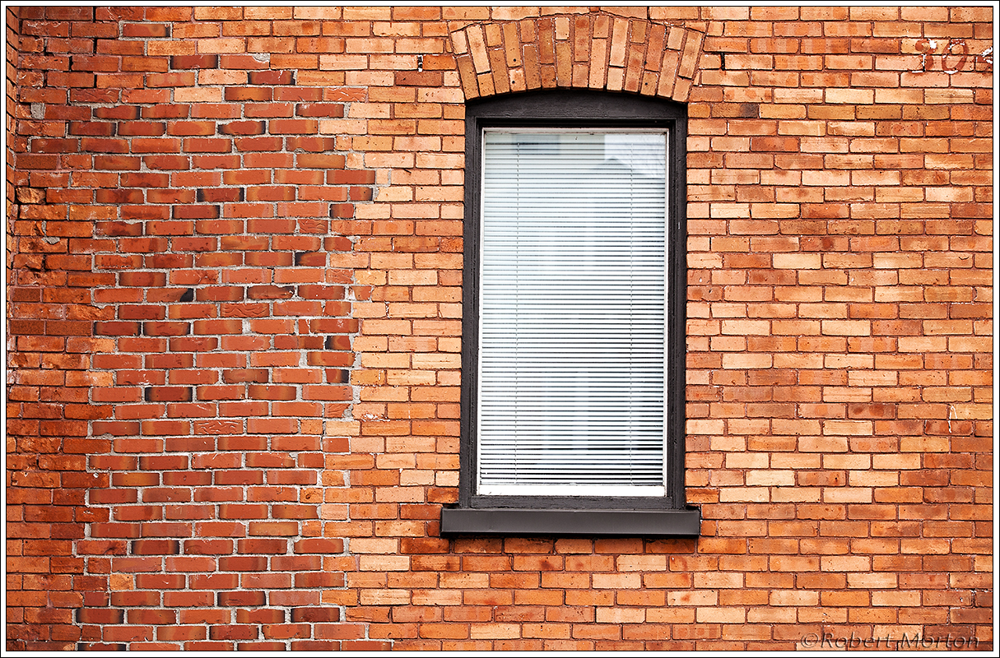

Grayscale изображение


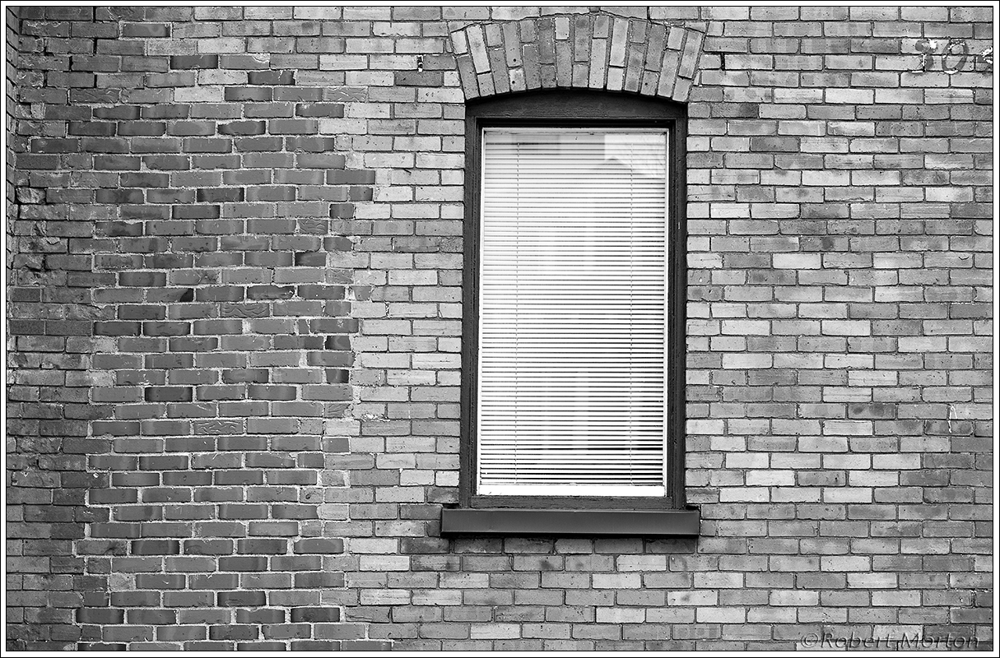

Контрастированное изображение


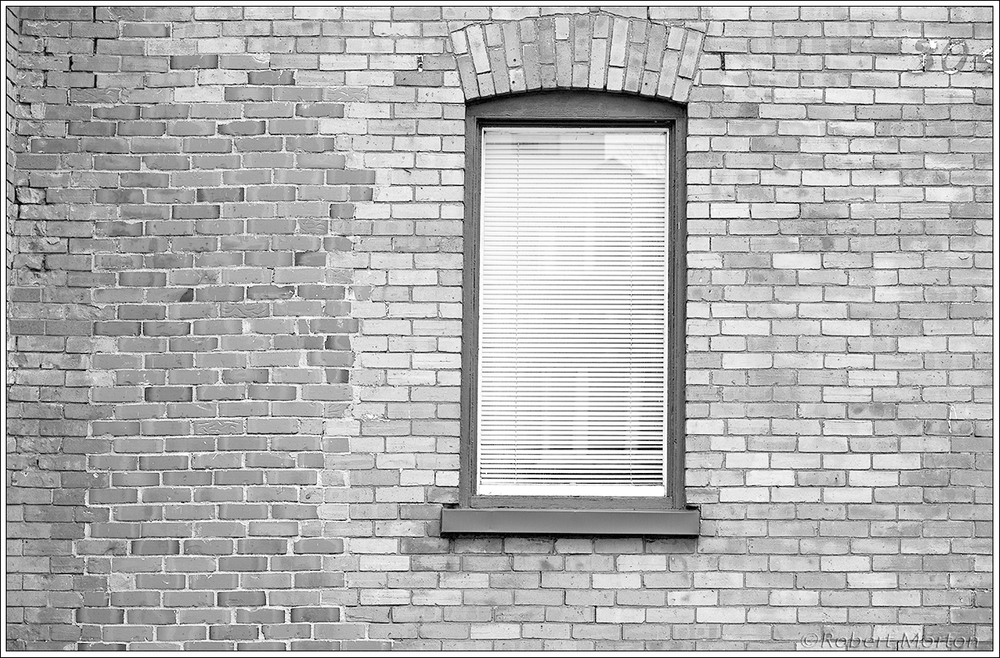

Гистограмма исходного изображения


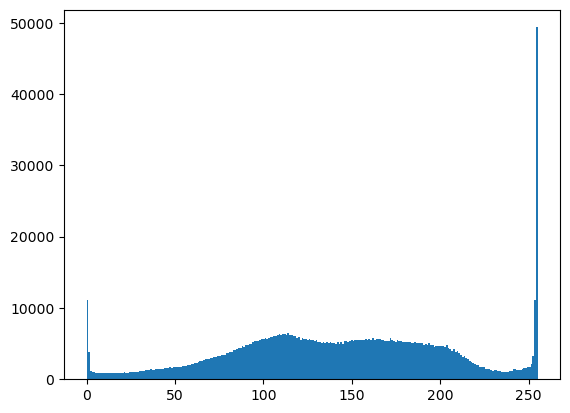

Гистограмма контрастированного изображения


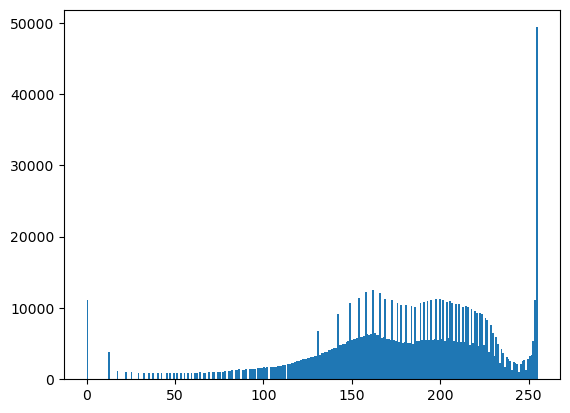

Матрица Харалика исходного изображения


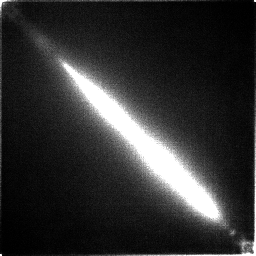

Матрица Харалика контрастированного изображения


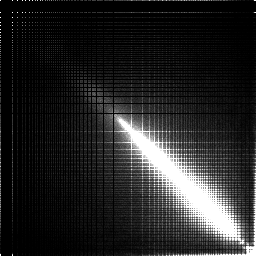

Корреляция исходного изображения = -2.5827145877025464e-07
Корреляция контрастированного изображения = -2.582714636313917e-07


In [231]:
result_display("stones.png")

Исходное изображение


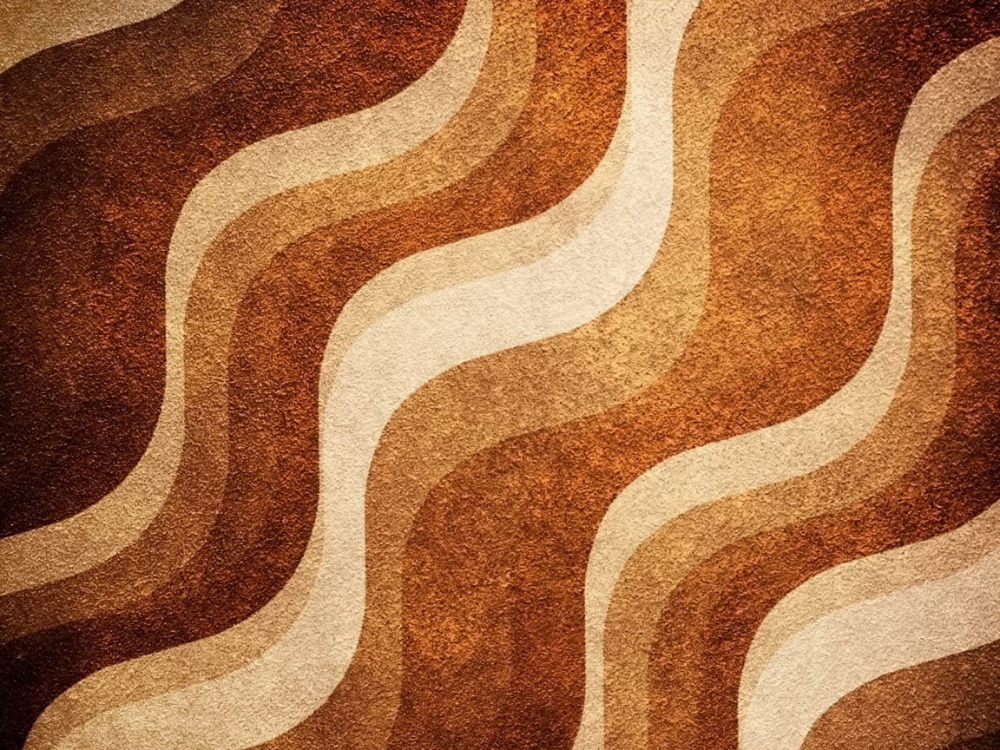

Grayscale изображение


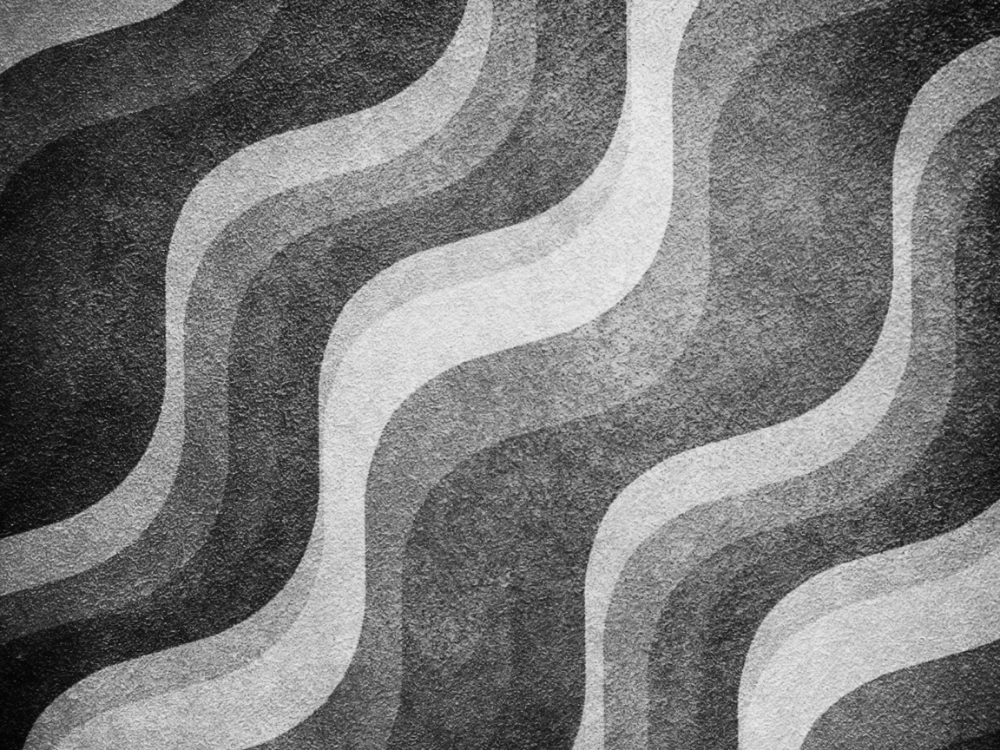

Контрастированное изображение


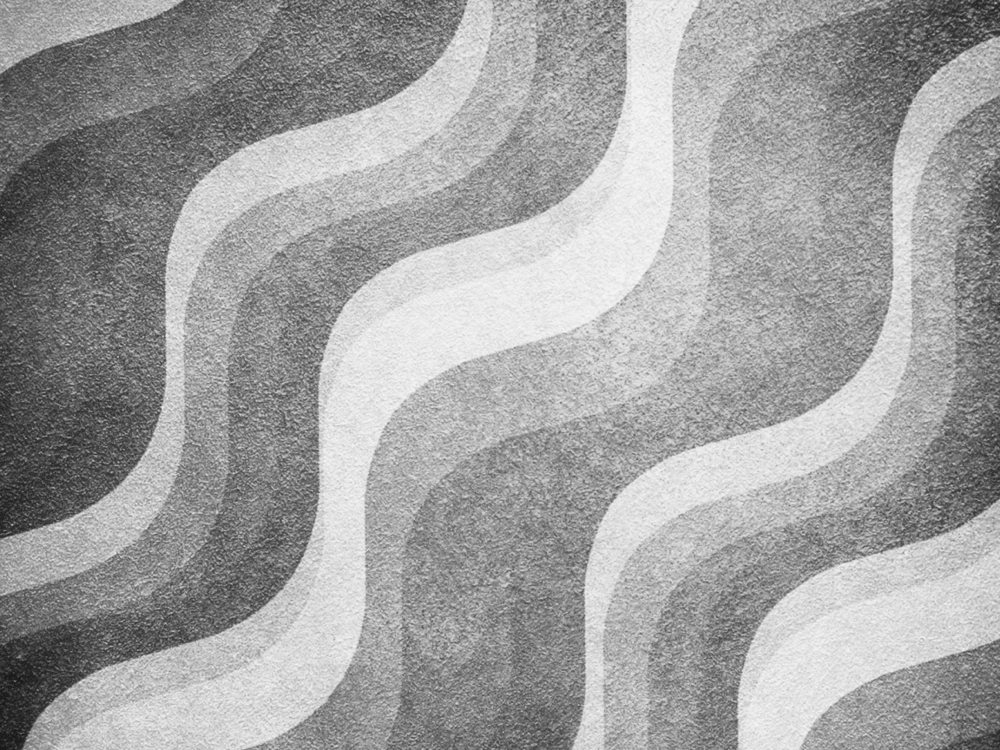

Гистограмма исходного изображения


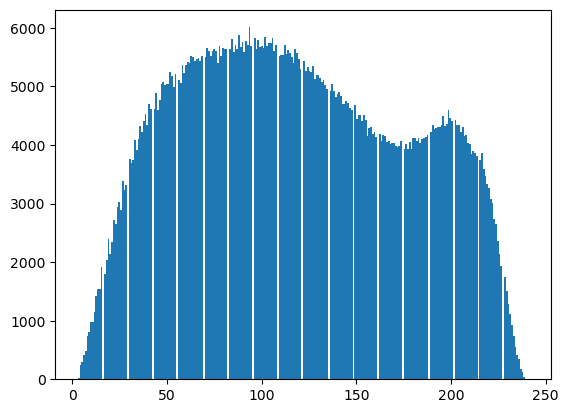

Гистограмма контрастированного изображения


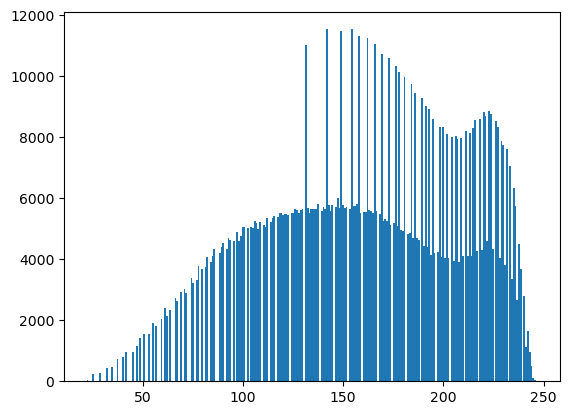

Матрица Харалика исходного изображения


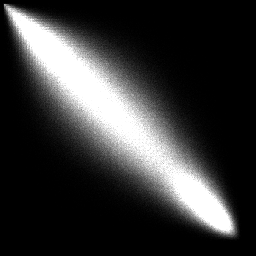

Матрица Харалика контрастированного изображения


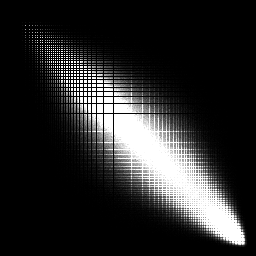

Корреляция исходного изображения = -2.5219413869308043e-07
Корреляция контрастированного изображения = -2.521941472379291e-07


In [233]:
result_display("waves.png")